
This notebook implements a text-driven image segmentation pipeline using GroundingDINO + SAM 2.

**Pipeline**: Text Prompt → GroundingDINO (detection) → SAM 2 (segmentation) → Visualization
**Goal**: Segment objects in images using natural language descriptions

## Installation and Setup

Install all required packages for the pipeline:

In [17]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install transformers pillow opencv-python matplotlib numpy
!pip install supervision gradio

!pip install git+https://github.com/facebookresearch/sam2.git
!pip install groundingdino-py

print("All packages installed successfully!")

Looking in indexes: https://download.pytorch.org/whl/cu121
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-9cmtbaqn
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-9cmtbaqn
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
✅ All packages installed successfully!


In [18]:
import torch
import numpy as np
import cv2
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

torch.manual_seed(42)
np.random.seed(42)

Using device: cuda


## Download Model Checkpoints

In [19]:
import os

os.makedirs('checkpoints', exist_ok=True)
os.makedirs('sample_images', exist_ok=True)

# Download SAM 2 checkpoint
!wget -q -P checkpoints https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

# Download sample images with proper extensions
!wget -q -O sample_images/truck.jpg https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
!wget -q -O sample_images/cat.jpg https://images.unsplash.com/photo-1574158622682-e40e69881006?w=800

print("Model checkpoints and sample images downloaded!")

# Verify downloads
print("\nDownloaded files:")
print("Checkpoints:", os.listdir('checkpoints'))
print("Sample images:", os.listdir('sample_images'))

Model checkpoints and sample images downloaded!

Downloaded files:
Checkpoints: ['sam2.1_hiera_large.pt.1', 'sam2.1_hiera_large.pt.2', 'sam2.1_hiera_large.pt']
Sample images: ['photo-1574158622682-e40e69881006?w=800', 'cat.jpg', 'truck.jpg']


## Load Models

In [20]:
class TextDrivenSegmentationPipeline:
    """
    A complete text-driven image segmentation pipeline combining GroundingDINO and SAM 2.
    """

    def __init__(self, sam_checkpoint_path='checkpoints/sam2.1_hiera_large.pt'):
        print("Loading models...")

        # Load GroundingDINO
        self.grounding_model_id = "IDEA-Research/grounding-dino-base"
        self.processor = AutoProcessor.from_pretrained(self.grounding_model_id)
        self.grounding_model = AutoModelForZeroShotObjectDetection.from_pretrained(
            self.grounding_model_id
        ).to(device)
        print("GroundingDINO loaded successfully!")

        # Load SAM 2
        sam2_model = build_sam2(
            "configs/sam2.1/sam2.1_hiera_l.yaml",
            sam_checkpoint_path,
            device=device
        )
        self.sam_predictor = SAM2ImagePredictor(sam2_model)
        print("SAM 2 loaded successfully!")
        print("Pipeline initialization complete!")

    def detect_objects(self, image, text_prompt, box_threshold=0.3, text_threshold=0.25):
        """
        Detect objects using GroundingDINO based on text prompt.
        Removed unsupported parameters from post_process call
        """
        # Prepare inputs
        inputs = self.processor(images=image, text=text_prompt, return_tensors="pt").to(device)

        # Run inference
        with torch.no_grad():
            outputs = self.grounding_model(**inputs)

        # Process results - Only pass supported parameters
        results = self.processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            target_sizes=[image.size[::-1]]  # (height, width)
        )

        # Manual thresholding after post-processing
        result = results[0]

        # Filter by box_threshold and text_threshold
        valid_indices = (result['scores'] >= box_threshold).cpu().numpy()

        filtered_result = {
            'boxes': result['boxes'][valid_indices],
            'scores': result['scores'][valid_indices],
            'labels': [label for i, label in enumerate(result['labels']) if valid_indices[i]]
        }

        return filtered_result

    def segment_from_boxes(self, image, boxes):
        """
        Generate segmentation masks using SAM 2 from detected bounding boxes.
        """
        # Convert PIL to numpy array
        image_np = np.array(image)

        # Set image for SAM predictor
        self.sam_predictor.set_image(image_np)

        all_masks = []
        all_scores = []

        # Process each detected box
        for box in boxes:
            # Convert box format (XYXY)
            box_np = box.cpu().numpy()

            # Generate mask using SAM 2
            masks, scores, _ = self.sam_predictor.predict(
                box=box_np[None, :],  # Add batch dimension
                multimask_output=False
            )

            all_masks.append(masks[0])  # Take first mask
            all_scores.append(scores[0])  # Take first score

        return all_masks, all_scores

    def segment_from_text(self, image, text_prompt, box_threshold=0.3, text_threshold=0.25):
        """
        Complete pipeline: text prompt -> detection -> segmentation
        """
        print(f"Processing text prompt: {text_prompt}")

        # Step 1: Detect objects
        detection_results = self.detect_objects(image, text_prompt, box_threshold, text_threshold)

        if len(detection_results['boxes']) == 0:
            print("No objects detected for the given prompt")
            return [], [], detection_results

        print(f" Detected {len(detection_results['boxes'])} objects")

        # Step 2: Generate segmentation masks
        masks, scores = self.segment_from_boxes(image, detection_results['boxes'])
        print(f" Generated {len(masks)} segmentation masks")

        return masks, scores, detection_results

## Visualization Functions

In [28]:
def create_mask_overlay(image, masks, alpha=0.6):
    """
    Create a colored overlay from segmentation masks.
    """
    image_np = np.array(image)
    overlay = image_np.copy()

    # Color palette for different masks
    colors = [
        (255, 0, 0),    # Red
        (0, 255, 0),    # Green
        (0, 0, 255),    # Blue
        (255, 255, 0),  # Yellow
        (255, 0, 255),  # Magenta
        (0, 255, 255),  # Cyan
        (255, 128, 0),  # Orange
        (128, 0, 255),  # Purple
    ]

    for i, mask in enumerate(masks):
        color = colors[i % len(colors)]

        # Apply colored mask
        for c in range(3):
            overlay[:, :, c] = np.where(
                mask,
                alpha * color[c] + (1 - alpha) * overlay[:, :, c],
                overlay[:, :, c]
            )

        # Add mask contours
        contours, _ = cv2.findContours(
            mask.astype(np.uint8),
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )
        cv2.drawContours(overlay, contours, -1, color, 3)

    return overlay


def visualize_results(image, masks, detection_results, text_prompt):
    """
    Create a comprehensive visualization of the segmentation results.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original image
    axes[0].imshow(image)
    axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    # Detection results (bounding boxes)
    image_with_boxes = image.copy()
    draw = ImageDraw.Draw(image_with_boxes)

    for i, (box, label, score) in enumerate(zip(
        detection_results['boxes'],
        detection_results['labels'],
        detection_results['scores']
    )):
        box = box.cpu().numpy()
        draw.rectangle(box, outline='red', width=3)

        # Add label and score
        label_text = f"{label} {score:.2f}"
        draw.text((box[0], box[1] - 20), label_text, fill='red')

    axes[1].imshow(image_with_boxes)
    axes[1].set_title(f'Detection Results: {text_prompt}', fontsize=14, fontweight='bold')
    axes[1].axis('off')

    # Segmentation results
    if masks:
        segmentation_overlay = create_mask_overlay(image, masks)
        axes[2].imshow(segmentation_overlay)
        axes[2].set_title(
            f'Segmentation Results: {len(masks)} masks generated',
            fontsize=14,
            fontweight='bold'
        )
    else:
        axes[2].imshow(image)
        axes[2].set_title('No Segmentation Results', fontsize=14, fontweight='bold')

    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # Print statistics
    if masks:
        print("\n" + "="*50)
        print("SEGMENTATION STATISTICS")
        print("="*50)
        print(f"Objects detected: {len(detection_results['boxes'])}")
        print(f"Masks generated: {len(masks)}")
        print(f"Average confidence: {np.mean([s.cpu() for s in detection_results['scores']]):.3f}")

        for i, (label, score) in enumerate(zip(detection_results['labels'], detection_results['scores'])):
            mask_area = np.sum(masks[i])
            total_pixels = masks[i].shape[0] * masks[i].shape[1]
            coverage = (mask_area / total_pixels) * 100
            print(f"  Mask {i+1}: {label} (conf: {score:.3f}, coverage: {coverage:.1f}%)")
    else:
        print("\nNo objects detected. Try adjusting thresholds or using a different prompt.")


def show_individual_masks(image, masks, text_prompt):
    """
    Display each segmentation mask individually.
    """
    if not masks:
        print("No masks to display")
        return

    num_masks = len(masks)
    cols = min(4, num_masks)
    rows = (num_masks + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))

    # CRITICAL FIX: Proper axes handling for different subplot configurations
    if num_masks == 1:
        # Single mask: axes is a single Axes object
        axes_list = [axes]
    elif rows == 1 and cols == 1:
        # Single subplot: axes is a single Axes object
        axes_list = [axes]
    elif rows == 1 or cols == 1:
        # Single row or column: axes is 1D array
        axes_list = list(axes.flat) if hasattr(axes, 'flat') else list(axes)
    else:
        # Multiple rows and columns: axes is 2D array
        axes_list = list(axes.flat)

    # Display each mask
    for i, mask in enumerate(masks):
        axes_list[i].imshow(mask, cmap='gray')
        axes_list[i].set_title(f'Mask {i+1}', fontsize=12)
        axes_list[i].axis('off')

    # Hide unused subplots
    for i in range(num_masks, len(axes_list)):
        axes_list[i].axis('off')

    plt.suptitle(f'Individual Masks for: {text_prompt}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


## Demo: Text-Driven Image Segmentation

In [29]:
def run_segmentation_demo(image_path, text_prompt, box_threshold=0.3, text_threshold=0.25):
    """
    Run the complete segmentation demo for a given image and text prompt.
    Always return a fixed tuple structure
    """
    print(f"\n{'='*50}")
    print(f"Running segmentation demo")
    print(f"{'='*50}")
    print(f"Image: {image_path}")
    print(f"Prompt: {text_prompt}")
    print("-" * 50)

    if not os.path.exists(image_path):
        print(f"ERROR: Could not find image: {image_path}")
        return None, None, None

    # Load image
    try:
        image = Image.open(image_path).convert('RGB')
        print(f" Image loaded: {image.size}")
    except Exception as e:
        print(f"ERROR loading image: {e}")
        return None, None, None

    # Run segmentation pipeline
    try:
        masks, scores, detection_results = pipeline.segment_from_text(
            image, text_prompt, box_threshold, text_threshold
        )

        # Visualize results
        visualize_results(image, masks, detection_results, text_prompt)

        # Show individual masks if any
        if masks:
            show_individual_masks(image, masks, text_prompt)

        return masks, detection_results, image

    except Exception as e:
        print(f"ERROR in segmentation pipeline: {e}")
        import traceback
        traceback.print_exc()
        return None, None, None


In [30]:
pipeline = TextDrivenSegmentationPipeline()


Loading models...
GroundingDINO loaded successfully!
SAM 2 loaded successfully!
Pipeline initialization complete!


## Example 1: Segment Vehicles


Running segmentation demo
Image: sample_images/truck.jpg
Prompt: truck. car. vehicle.
--------------------------------------------------
✓ Image loaded: (1800, 1200)
Processing text prompt: truck. car. vehicle.
✓ Detected 3 objects
✓ Generated 3 segmentation masks


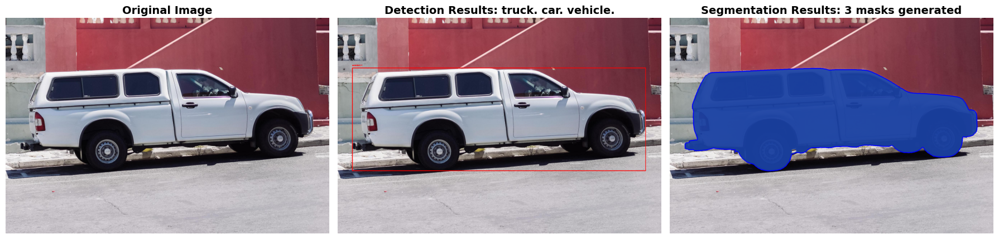


SEGMENTATION STATISTICS
Objects detected: 3
Masks generated: 3
Average confidence: 0.492
  Mask 1: car (conf: 0.554, coverage: 29.7%)
  Mask 2: truck (conf: 0.645, coverage: 29.7%)
  Mask 3: vehicle (conf: 0.277, coverage: 29.7%)


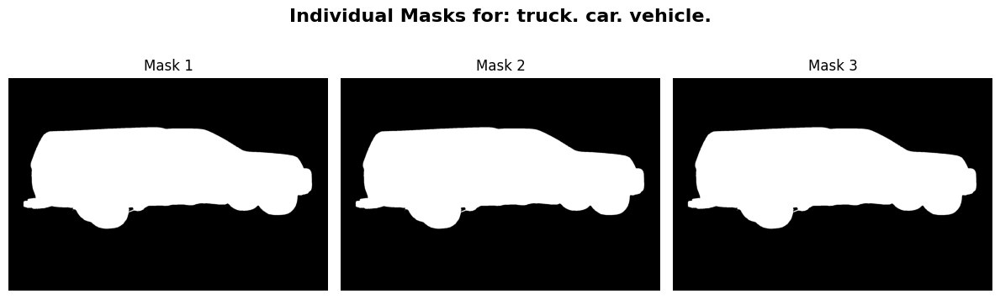


✓ Demo 1 completed successfully with 3 masks


In [31]:
masks1, results1, img1 = run_segmentation_demo(
    image_path='sample_images/truck.jpg',
    text_prompt='truck. car. vehicle.',
    box_threshold=0.25,
    text_threshold=0.2
)

if masks1 is not None:
    print(f"\n Demo 1 completed successfully with {len(masks1)} masks")
else:
    print("\n Demo 1 failed")

## Example 2: Segment Animals


Running segmentation demo
Image: sample_images/cat.jpg
Prompt: cat. kitten.
--------------------------------------------------
✓ Image loaded: (800, 800)
Processing text prompt: cat. kitten.
✓ Detected 1 objects
✓ Generated 1 segmentation masks


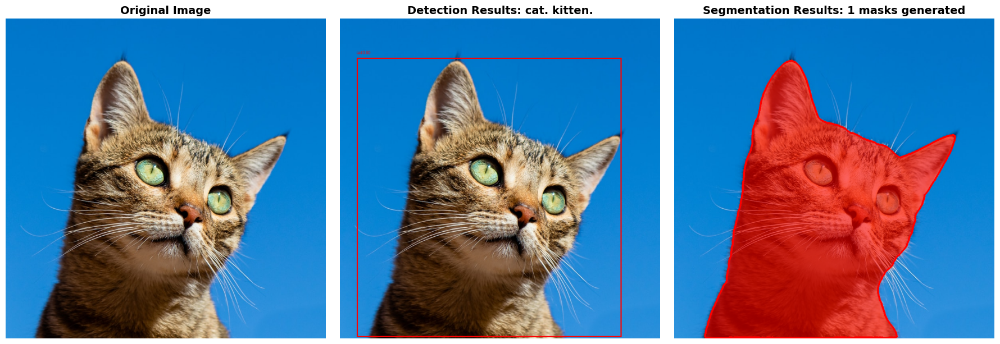


SEGMENTATION STATISTICS
Objects detected: 1
Masks generated: 1
Average confidence: 0.598
  Mask 1: cat (conf: 0.598, coverage: 38.3%)


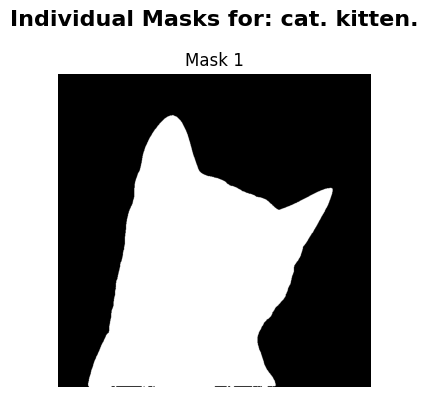


✓ Demo 2 completed successfully with 1 masks


In [32]:
masks2, results2, img2 = run_segmentation_demo(
    image_path='sample_images/cat.jpg',
    text_prompt='cat. kitten.',
    box_threshold=0.3,
    text_threshold=0.25
)

if masks2 is not None:
    print(f"\n Demo 2 completed successfully with {len(masks2)} masks")
else:
    print("\n Demo 2 failed")

## Interactive Demo


COMPREHENSIVE TESTING ON DOWNLOADED IMAGES

Testing: Majestic mountain landscape
Image: sample_images/test/mountain_scape.jpg
Prompt: mountain. snow. sky. cloud.

 Configuration: Very Sensitive
   Box threshold: 0.2, Text threshold: 0.15

Running segmentation demo
Image: sample_images/test/mountain_scape.jpg
Prompt: mountain. snow. sky. cloud.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: mountain. snow. sky. cloud.
✓ Detected 9 objects
✓ Generated 9 segmentation masks


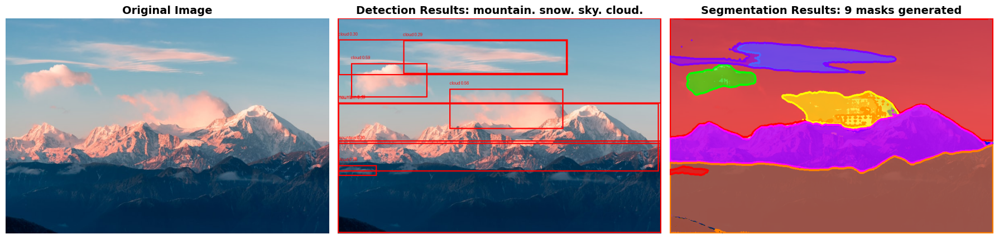


SEGMENTATION STATISTICS
Objects detected: 9
Masks generated: 9
Average confidence: 0.427
  Mask 1: sky (conf: 0.738, coverage: 47.8%)
  Mask 2: cloud (conf: 0.591, coverage: 1.8%)
  Mask 3: mountain (conf: 0.449, coverage: 49.8%)
  Mask 4: cloud (conf: 0.556, coverage: 4.0%)
  Mask 5: mountain (conf: 0.372, coverage: 16.6%)
  Mask 6: cloud (conf: 0.286, coverage: 3.9%)
  Mask 7: mountain (conf: 0.296, coverage: 32.9%)
  Mask 8: cloud (conf: 0.301, coverage: 4.9%)
  Mask 9: cloud (conf: 0.258, coverage: 0.3%)


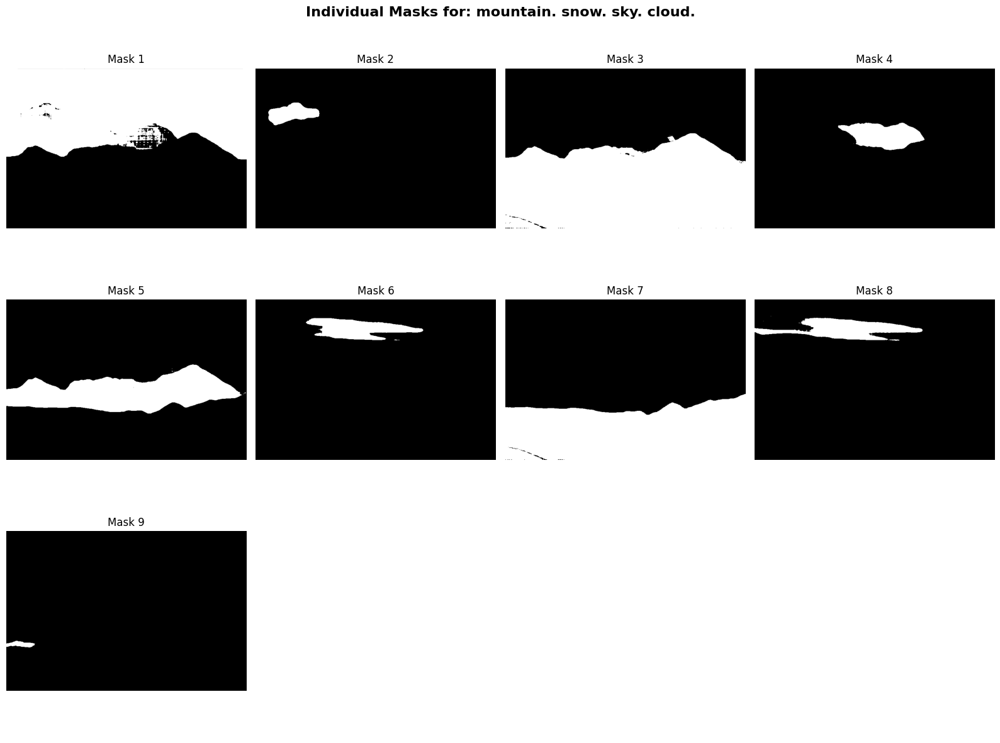

   Success: 9 masks detected
   Avg confidence: 0.427
   Objects: sky, cloud, mountain, cloud, mountain, cloud, mountain, cloud, cloud

 Configuration: Sensitive
   Box threshold: 0.25, Text threshold: 0.2

Running segmentation demo
Image: sample_images/test/mountain_scape.jpg
Prompt: mountain. snow. sky. cloud.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: mountain. snow. sky. cloud.
✓ Detected 9 objects
✓ Generated 9 segmentation masks


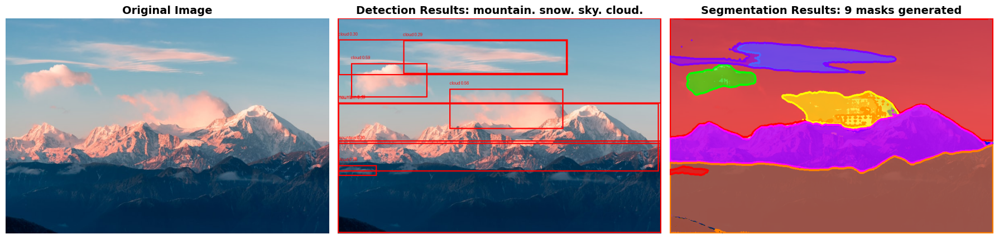


SEGMENTATION STATISTICS
Objects detected: 9
Masks generated: 9
Average confidence: 0.427
  Mask 1: sky (conf: 0.738, coverage: 47.8%)
  Mask 2: cloud (conf: 0.591, coverage: 1.8%)
  Mask 3: mountain (conf: 0.449, coverage: 49.8%)
  Mask 4: cloud (conf: 0.556, coverage: 4.0%)
  Mask 5: mountain (conf: 0.372, coverage: 16.6%)
  Mask 6: cloud (conf: 0.286, coverage: 3.9%)
  Mask 7: mountain (conf: 0.296, coverage: 32.9%)
  Mask 8: cloud (conf: 0.301, coverage: 4.9%)
  Mask 9: cloud (conf: 0.258, coverage: 0.3%)


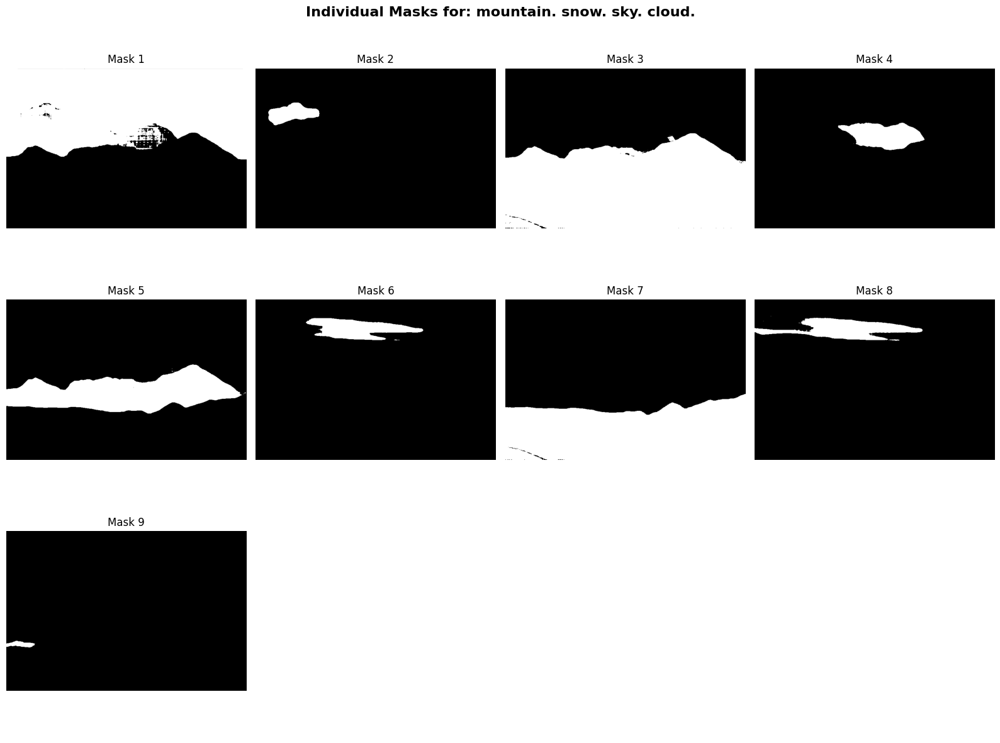

   Success: 9 masks detected
   Avg confidence: 0.427
   Objects: sky, cloud, mountain, cloud, mountain, cloud, mountain, cloud, cloud

 Configuration: Balanced
   Box threshold: 0.3, Text threshold: 0.25

Running segmentation demo
Image: sample_images/test/mountain_scape.jpg
Prompt: mountain. snow. sky. cloud.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: mountain. snow. sky. cloud.
✓ Detected 6 objects
✓ Generated 6 segmentation masks


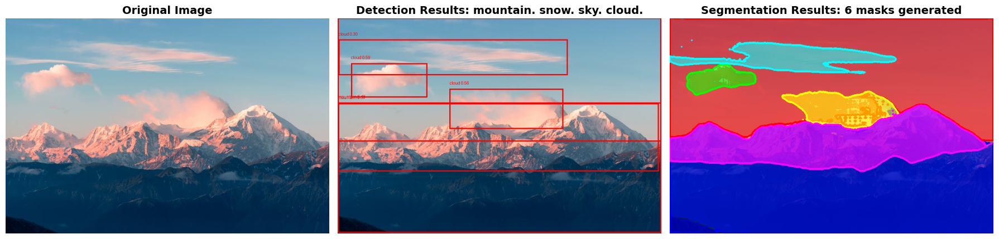


SEGMENTATION STATISTICS
Objects detected: 6
Masks generated: 6
Average confidence: 0.501
  Mask 1: sky (conf: 0.738, coverage: 47.8%)
  Mask 2: cloud (conf: 0.591, coverage: 1.8%)
  Mask 3: mountain (conf: 0.449, coverage: 49.8%)
  Mask 4: cloud (conf: 0.556, coverage: 4.0%)
  Mask 5: mountain (conf: 0.372, coverage: 16.6%)
  Mask 6: cloud (conf: 0.301, coverage: 4.9%)


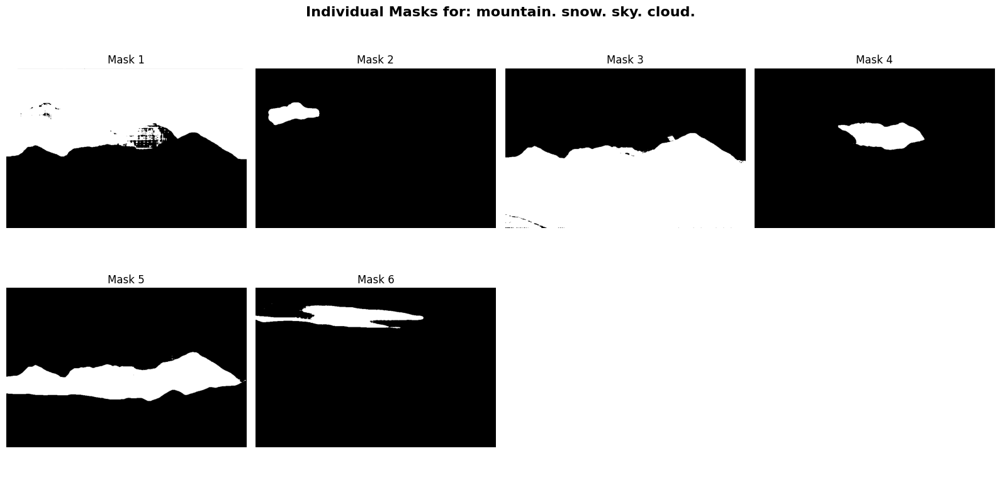

   Success: 6 masks detected
   Avg confidence: 0.501
   Objects: sky, cloud, mountain, cloud, mountain, cloud

 Configuration: Strict
   Box threshold: 0.35, Text threshold: 0.3

Running segmentation demo
Image: sample_images/test/mountain_scape.jpg
Prompt: mountain. snow. sky. cloud.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: mountain. snow. sky. cloud.
✓ Detected 5 objects
✓ Generated 5 segmentation masks


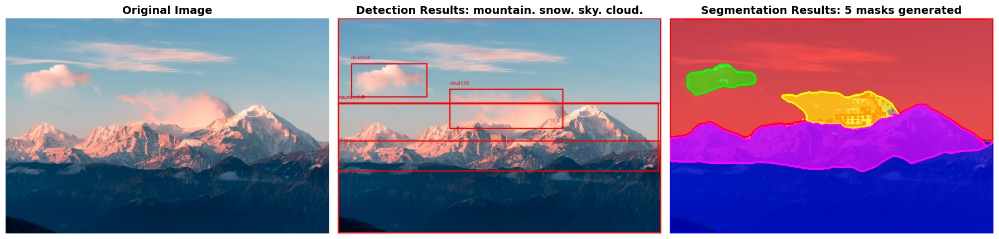


SEGMENTATION STATISTICS
Objects detected: 5
Masks generated: 5
Average confidence: 0.541
  Mask 1: sky (conf: 0.738, coverage: 47.8%)
  Mask 2: cloud (conf: 0.591, coverage: 1.8%)
  Mask 3: mountain (conf: 0.449, coverage: 49.8%)
  Mask 4: cloud (conf: 0.556, coverage: 4.0%)
  Mask 5: mountain (conf: 0.372, coverage: 16.6%)


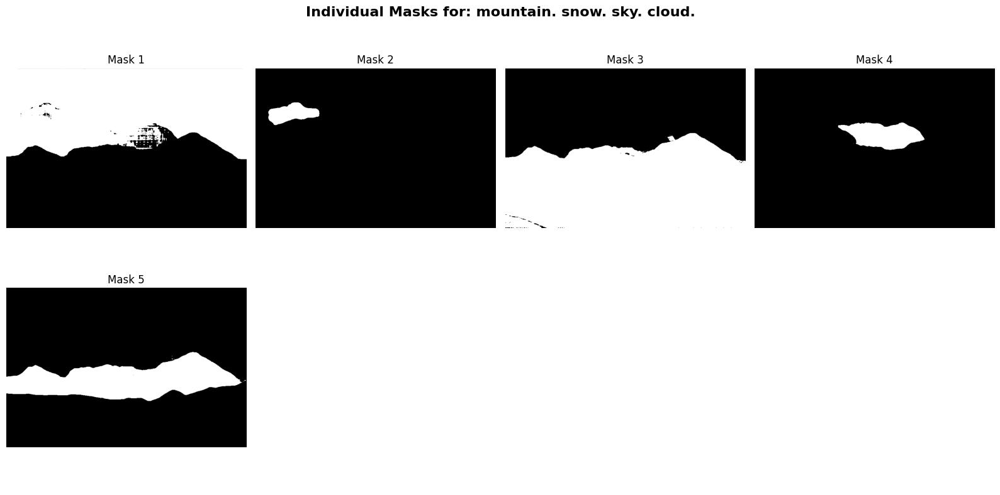

   Success: 5 masks detected
   Avg confidence: 0.541
   Objects: sky, cloud, mountain, cloud, mountain

Testing: Bustling street market
Image: sample_images/test/street_market.jpg
Prompt: person. fruit. vegetable. market stall.

 Configuration: Very Sensitive
   Box threshold: 0.2, Text threshold: 0.15

Running segmentation demo
Image: sample_images/test/street_market.jpg
Prompt: person. fruit. vegetable. market stall.
--------------------------------------------------
✓ Image loaded: (800, 532)
Processing text prompt: person. fruit. vegetable. market stall.
✓ Detected 1 objects
✓ Generated 1 segmentation masks


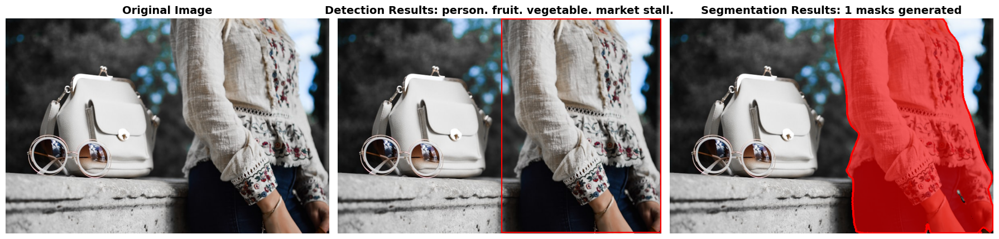


SEGMENTATION STATISTICS
Objects detected: 1
Masks generated: 1
Average confidence: 0.468
  Mask 1: person (conf: 0.468, coverage: 39.0%)


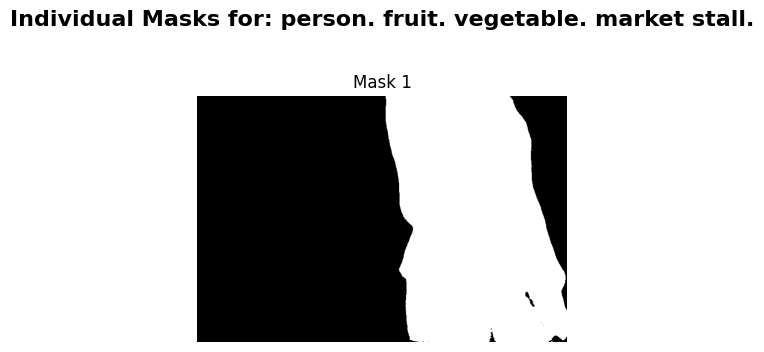

   Success: 1 masks detected
   Avg confidence: 0.468
   Objects: person

 Configuration: Sensitive
   Box threshold: 0.25, Text threshold: 0.2

Running segmentation demo
Image: sample_images/test/street_market.jpg
Prompt: person. fruit. vegetable. market stall.
--------------------------------------------------
✓ Image loaded: (800, 532)
Processing text prompt: person. fruit. vegetable. market stall.
✓ Detected 1 objects
✓ Generated 1 segmentation masks


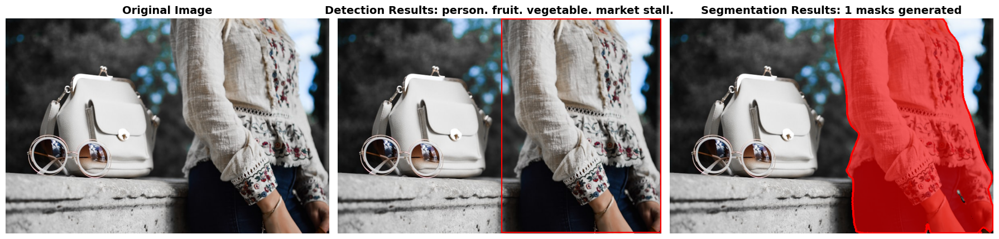


SEGMENTATION STATISTICS
Objects detected: 1
Masks generated: 1
Average confidence: 0.468
  Mask 1: person (conf: 0.468, coverage: 39.0%)


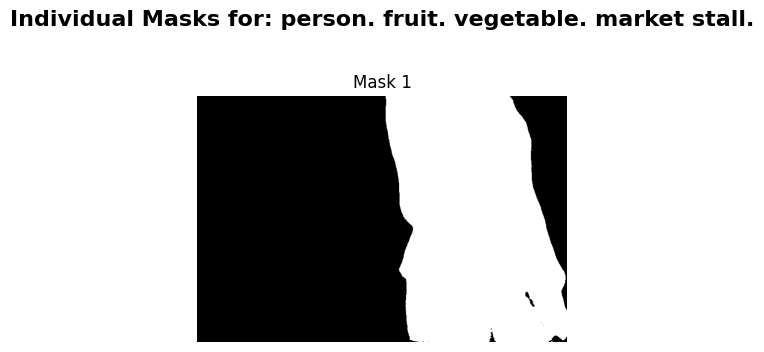

   Success: 1 masks detected
   Avg confidence: 0.468
   Objects: person

 Configuration: Balanced
   Box threshold: 0.3, Text threshold: 0.25

Running segmentation demo
Image: sample_images/test/street_market.jpg
Prompt: person. fruit. vegetable. market stall.
--------------------------------------------------
✓ Image loaded: (800, 532)
Processing text prompt: person. fruit. vegetable. market stall.
✓ Detected 1 objects
✓ Generated 1 segmentation masks


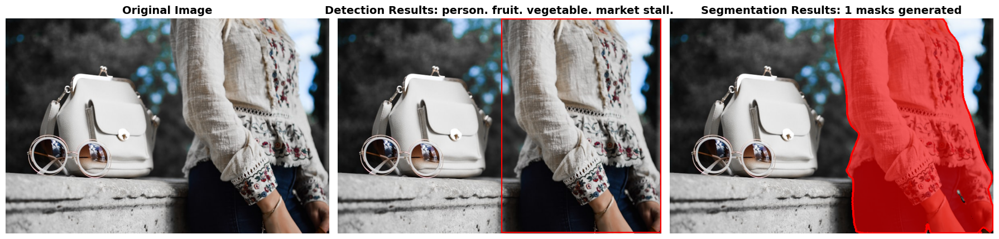


SEGMENTATION STATISTICS
Objects detected: 1
Masks generated: 1
Average confidence: 0.468
  Mask 1: person (conf: 0.468, coverage: 39.0%)


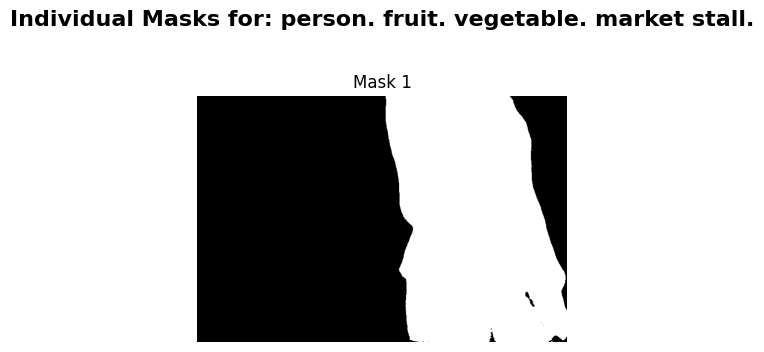

   Success: 1 masks detected
   Avg confidence: 0.468
   Objects: person

 Configuration: Strict
   Box threshold: 0.35, Text threshold: 0.3

Running segmentation demo
Image: sample_images/test/street_market.jpg
Prompt: person. fruit. vegetable. market stall.
--------------------------------------------------
✓ Image loaded: (800, 532)
Processing text prompt: person. fruit. vegetable. market stall.
✓ Detected 1 objects
✓ Generated 1 segmentation masks


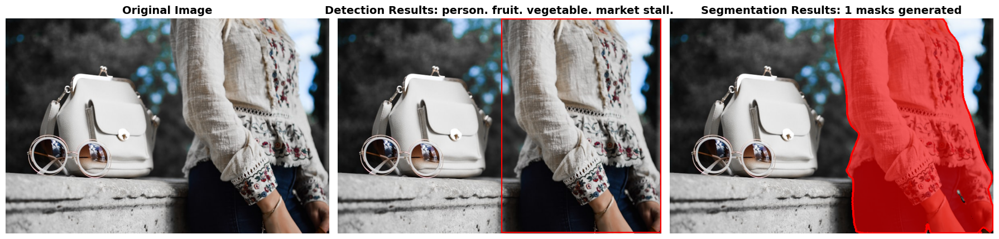


SEGMENTATION STATISTICS
Objects detected: 1
Masks generated: 1
Average confidence: 0.468
  Mask 1: person (conf: 0.468, coverage: 39.0%)


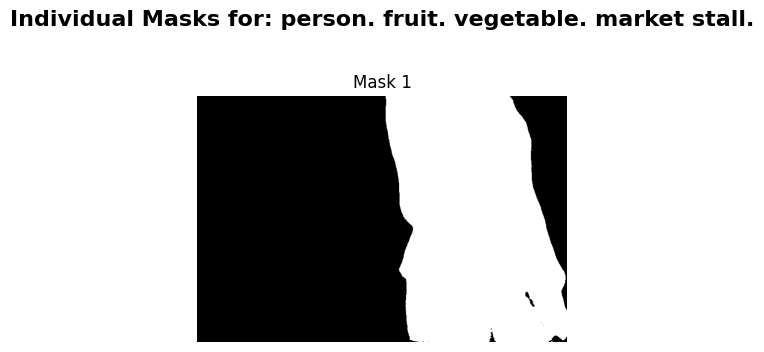

   Success: 1 masks detected
   Avg confidence: 0.468
   Objects: person

Testing: Colorful platter of sushi
Image: sample_images/test/sushi_platter.jpg
Prompt: sushi. rice. fish. chopsticks. plate.

 Configuration: Very Sensitive
   Box threshold: 0.2, Text threshold: 0.15

Running segmentation demo
Image: sample_images/test/sushi_platter.jpg
Prompt: sushi. rice. fish. chopsticks. plate.
--------------------------------------------------
✓ Image loaded: (800, 1421)
Processing text prompt: sushi. rice. fish. chopsticks. plate.
✓ Detected 14 objects
✓ Generated 14 segmentation masks


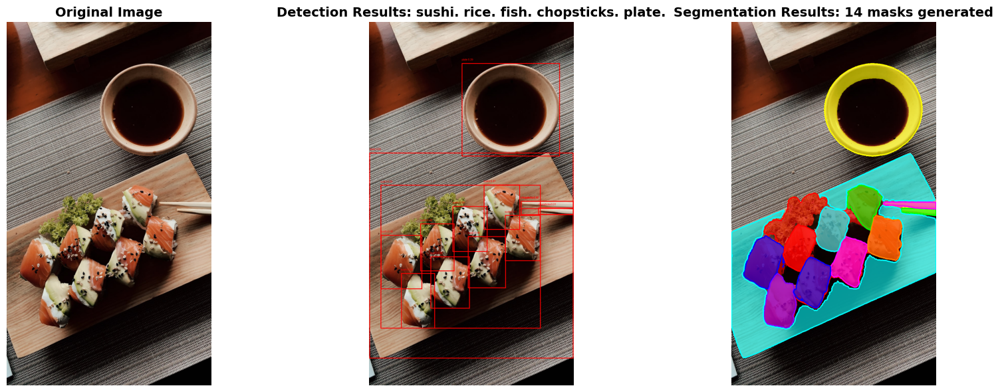


SEGMENTATION STATISTICS
Objects detected: 14
Masks generated: 14
Average confidence: 0.395
  Mask 1: sushi (conf: 0.387, coverage: 15.2%)
  Mask 2: sushi (conf: 0.411, coverage: 1.3%)
  Mask 3: sushi (conf: 0.397, coverage: 1.9%)
  Mask 4: chopsticks (conf: 0.467, coverage: 0.6%)
  Mask 5: sushi (conf: 0.399, coverage: 1.6%)
  Mask 6: sushi (conf: 0.395, coverage: 1.5%)
  Mask 7: sushi (conf: 0.414, coverage: 1.6%)
  Mask 8: sushi (conf: 0.393, coverage: 1.7%)
  Mask 9: sushi (conf: 0.383, coverage: 1.3%)
  Mask 10: chopsticks (conf: 0.314, coverage: 0.2%)
  Mask 11: sushi (conf: 0.391, coverage: 1.7%)
  Mask 12: plate (conf: 0.290, coverage: 4.3%)
  Mask 13: chopsticks (conf: 0.334, coverage: 0.4%)
  Mask 14: plate (conf: 0.553, coverage: 16.3%)


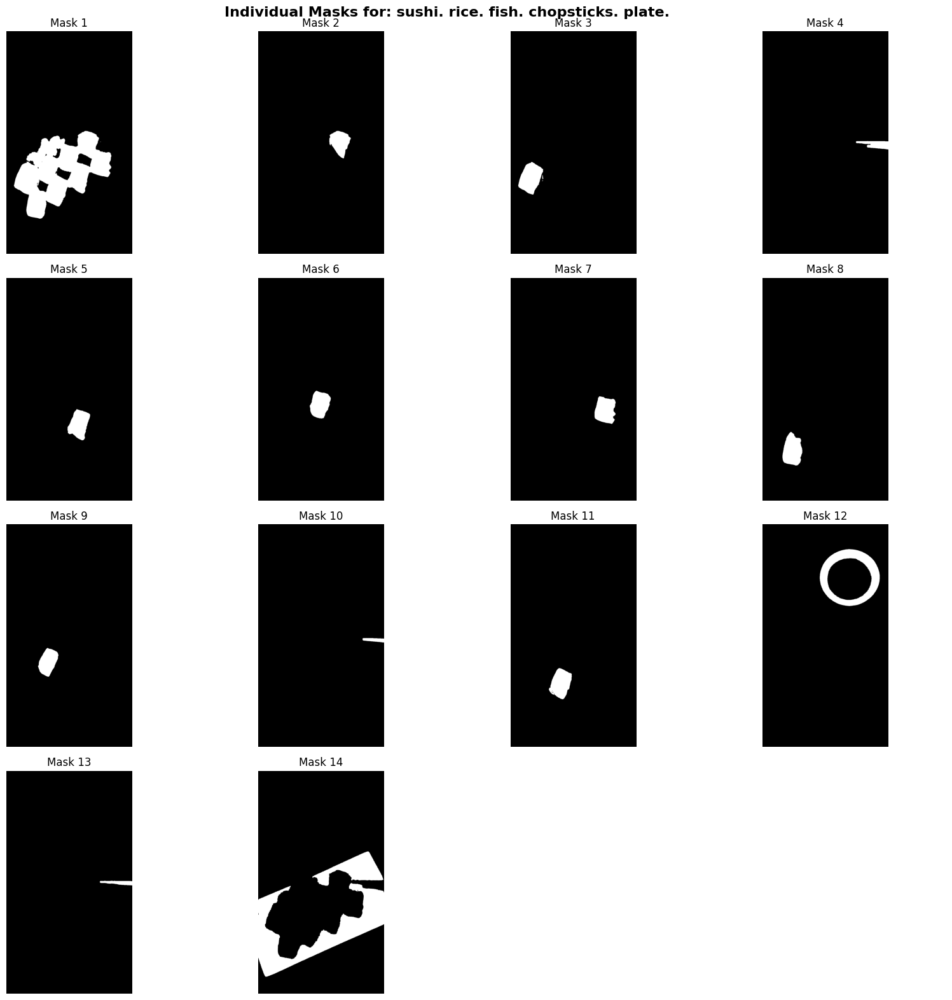

   Success: 14 masks detected
   Avg confidence: 0.395
   Objects: sushi, sushi, sushi, chopsticks, sushi, sushi, sushi, sushi, sushi, chopsticks, sushi, plate, chopsticks, plate

 Configuration: Sensitive
   Box threshold: 0.25, Text threshold: 0.2

Running segmentation demo
Image: sample_images/test/sushi_platter.jpg
Prompt: sushi. rice. fish. chopsticks. plate.
--------------------------------------------------
✓ Image loaded: (800, 1421)
Processing text prompt: sushi. rice. fish. chopsticks. plate.
✓ Detected 14 objects
✓ Generated 14 segmentation masks


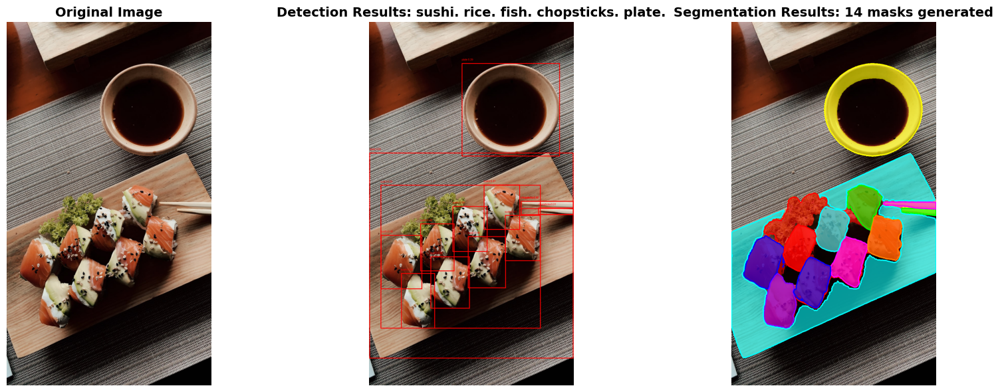


SEGMENTATION STATISTICS
Objects detected: 14
Masks generated: 14
Average confidence: 0.395
  Mask 1: sushi (conf: 0.387, coverage: 15.2%)
  Mask 2: sushi (conf: 0.411, coverage: 1.3%)
  Mask 3: sushi (conf: 0.397, coverage: 1.9%)
  Mask 4: chopsticks (conf: 0.467, coverage: 0.6%)
  Mask 5: sushi (conf: 0.399, coverage: 1.6%)
  Mask 6: sushi (conf: 0.395, coverage: 1.5%)
  Mask 7: sushi (conf: 0.414, coverage: 1.6%)
  Mask 8: sushi (conf: 0.393, coverage: 1.7%)
  Mask 9: sushi (conf: 0.383, coverage: 1.3%)
  Mask 10: chopsticks (conf: 0.314, coverage: 0.2%)
  Mask 11: sushi (conf: 0.391, coverage: 1.7%)
  Mask 12: plate (conf: 0.290, coverage: 4.3%)
  Mask 13: chopsticks (conf: 0.334, coverage: 0.4%)
  Mask 14: plate (conf: 0.553, coverage: 16.3%)


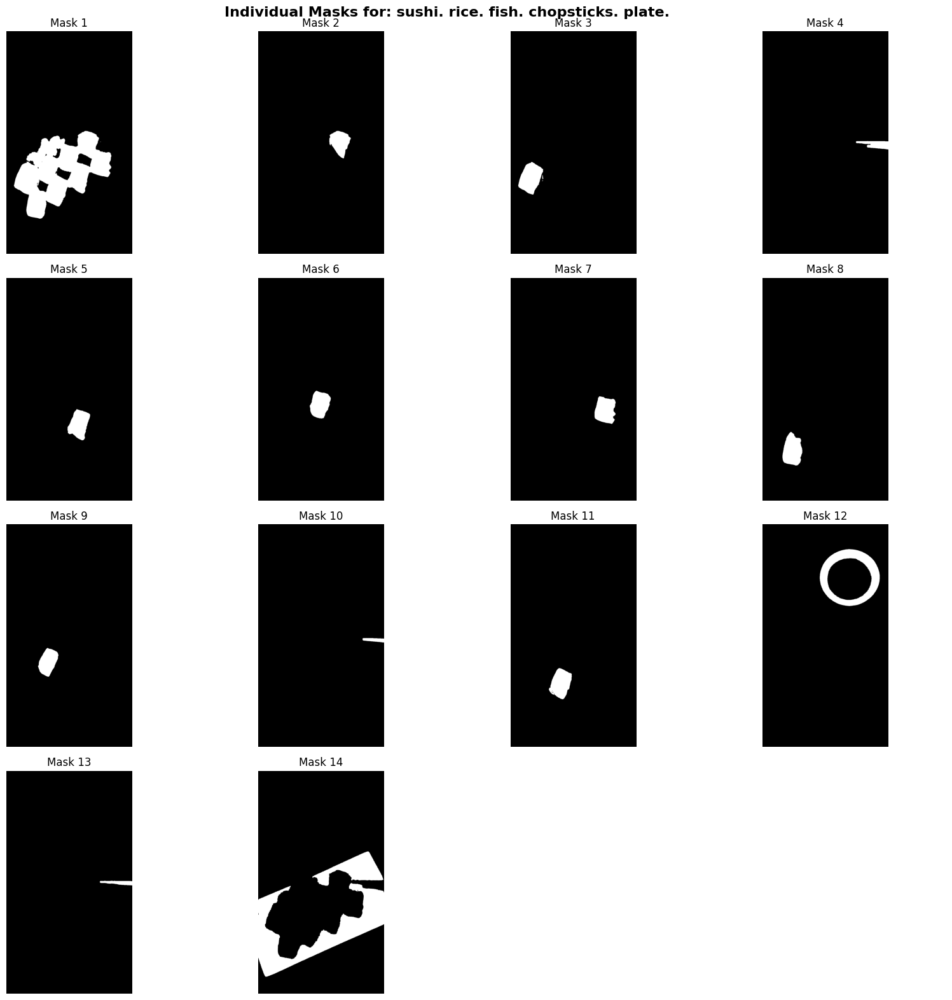

   Success: 14 masks detected
   Avg confidence: 0.395
   Objects: sushi, sushi, sushi, chopsticks, sushi, sushi, sushi, sushi, sushi, chopsticks, sushi, plate, chopsticks, plate

 Configuration: Balanced
   Box threshold: 0.3, Text threshold: 0.25

Running segmentation demo
Image: sample_images/test/sushi_platter.jpg
Prompt: sushi. rice. fish. chopsticks. plate.
--------------------------------------------------
✓ Image loaded: (800, 1421)
Processing text prompt: sushi. rice. fish. chopsticks. plate.
✓ Detected 13 objects
✓ Generated 13 segmentation masks


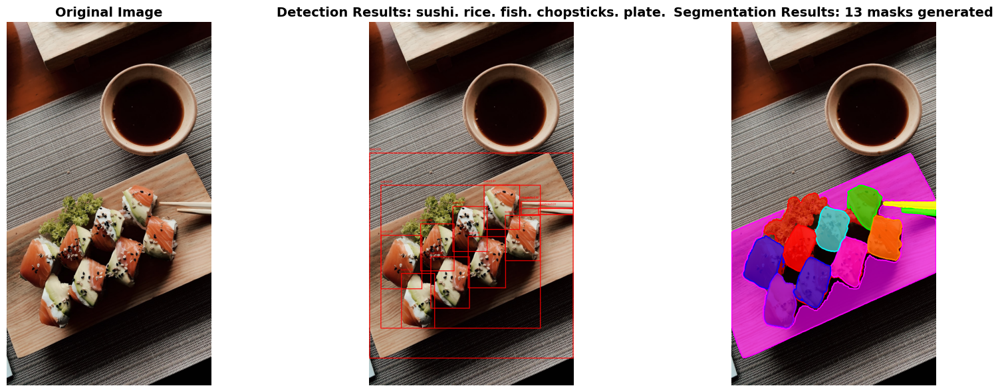


SEGMENTATION STATISTICS
Objects detected: 13
Masks generated: 13
Average confidence: 0.403
  Mask 1: sushi (conf: 0.387, coverage: 15.2%)
  Mask 2: sushi (conf: 0.411, coverage: 1.3%)
  Mask 3: sushi (conf: 0.397, coverage: 1.9%)
  Mask 4: chopsticks (conf: 0.467, coverage: 0.6%)
  Mask 5: sushi (conf: 0.399, coverage: 1.6%)
  Mask 6: sushi (conf: 0.395, coverage: 1.5%)
  Mask 7: sushi (conf: 0.414, coverage: 1.6%)
  Mask 8: sushi (conf: 0.393, coverage: 1.7%)
  Mask 9: sushi (conf: 0.383, coverage: 1.3%)
  Mask 10: chopsticks (conf: 0.314, coverage: 0.2%)
  Mask 11: sushi (conf: 0.391, coverage: 1.7%)
  Mask 12: chopsticks (conf: 0.334, coverage: 0.4%)
  Mask 13: plate (conf: 0.553, coverage: 16.3%)


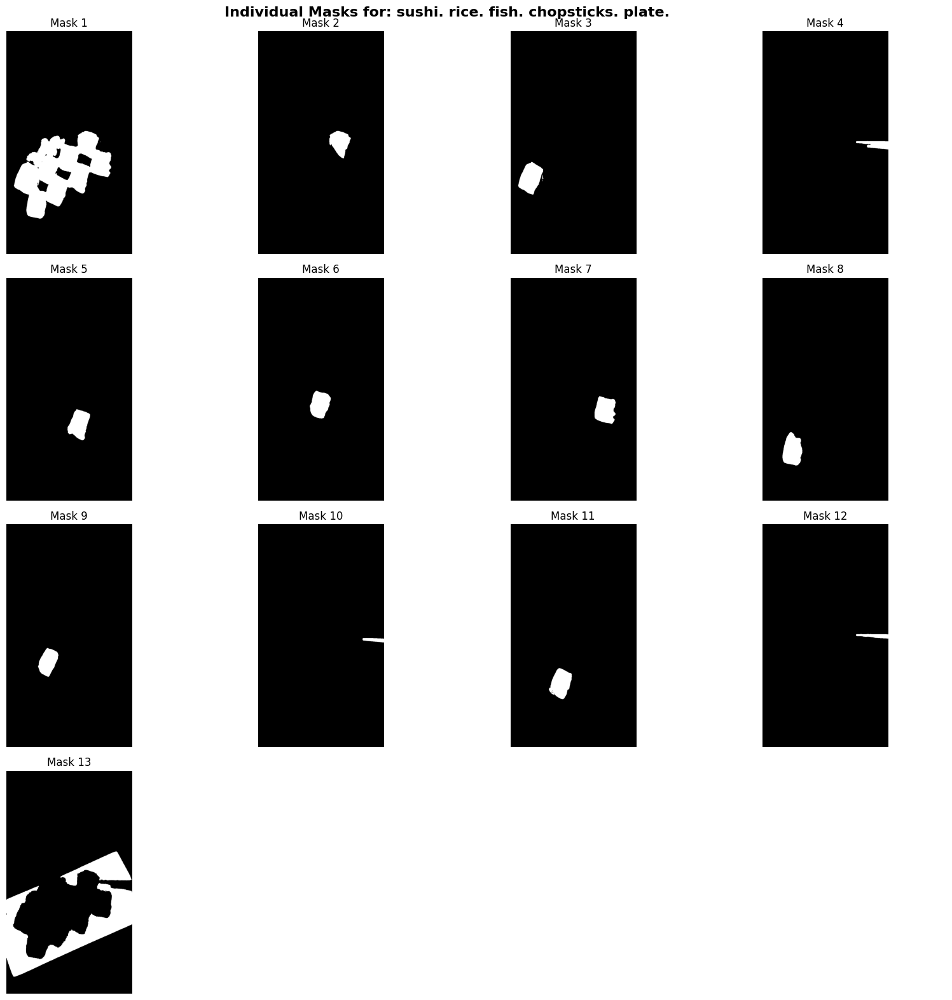

   Success: 13 masks detected
   Avg confidence: 0.403
   Objects: sushi, sushi, sushi, chopsticks, sushi, sushi, sushi, sushi, sushi, chopsticks, sushi, chopsticks, plate

 Configuration: Strict
   Box threshold: 0.35, Text threshold: 0.3

Running segmentation demo
Image: sample_images/test/sushi_platter.jpg
Prompt: sushi. rice. fish. chopsticks. plate.
--------------------------------------------------
✓ Image loaded: (800, 1421)
Processing text prompt: sushi. rice. fish. chopsticks. plate.
✓ Detected 11 objects
✓ Generated 11 segmentation masks


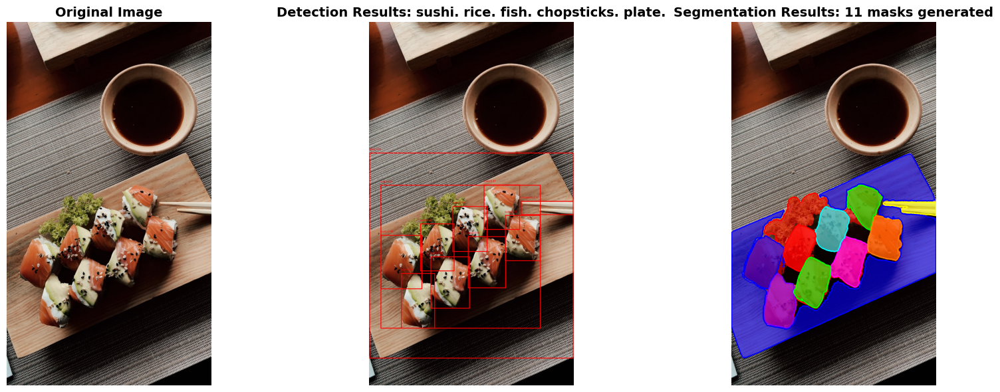


SEGMENTATION STATISTICS
Objects detected: 11
Masks generated: 11
Average confidence: 0.417
  Mask 1: sushi (conf: 0.387, coverage: 15.2%)
  Mask 2: sushi (conf: 0.411, coverage: 1.3%)
  Mask 3: sushi (conf: 0.397, coverage: 1.9%)
  Mask 4: chopsticks (conf: 0.467, coverage: 0.6%)
  Mask 5: sushi (conf: 0.399, coverage: 1.6%)
  Mask 6: sushi (conf: 0.395, coverage: 1.5%)
  Mask 7: sushi (conf: 0.414, coverage: 1.6%)
  Mask 8: sushi (conf: 0.393, coverage: 1.7%)
  Mask 9: sushi (conf: 0.383, coverage: 1.3%)
  Mask 10: sushi (conf: 0.391, coverage: 1.7%)
  Mask 11: plate (conf: 0.553, coverage: 16.3%)


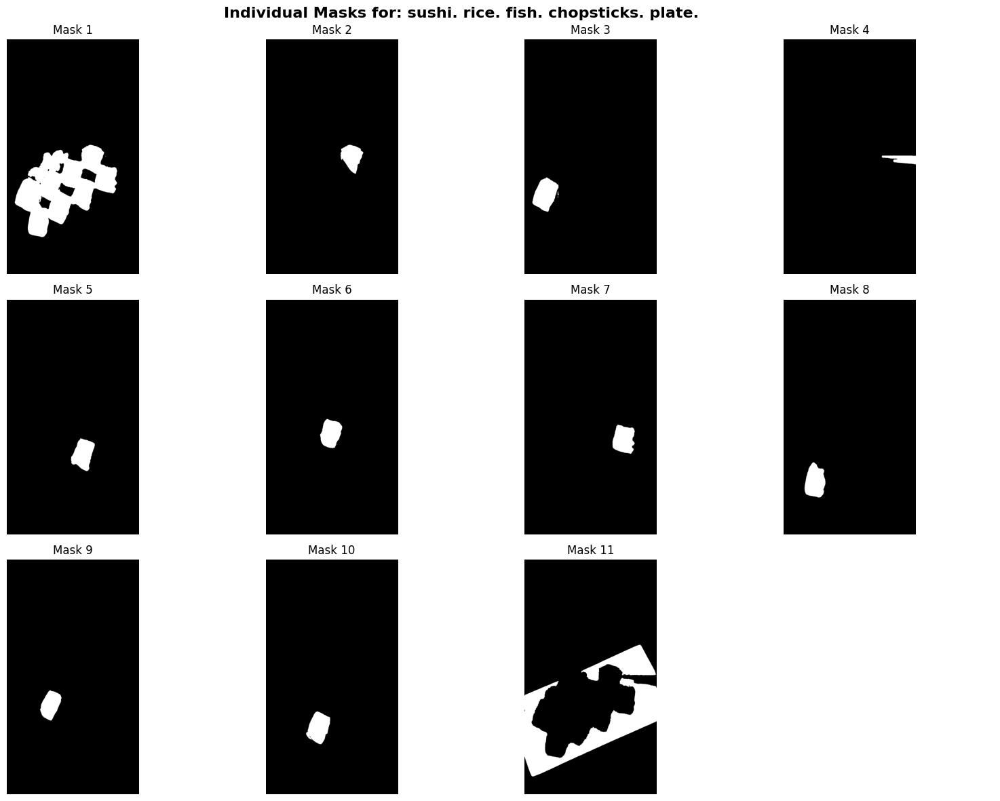

   Success: 11 masks detected
   Avg confidence: 0.417
   Objects: sushi, sushi, sushi, chopsticks, sushi, sushi, sushi, sushi, sushi, sushi, plate

Testing: Close-up of a tech circuit board
Image: sample_images/test/tech_circuit.jpg
Prompt: circuit board. microchip. electronics. technology.

 Configuration: Very Sensitive
   Box threshold: 0.2, Text threshold: 0.15

Running segmentation demo
Image: sample_images/test/tech_circuit.jpg
Prompt: circuit board. microchip. electronics. technology.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: circuit board. microchip. electronics. technology.
✓ Detected 3 objects
✓ Generated 3 segmentation masks


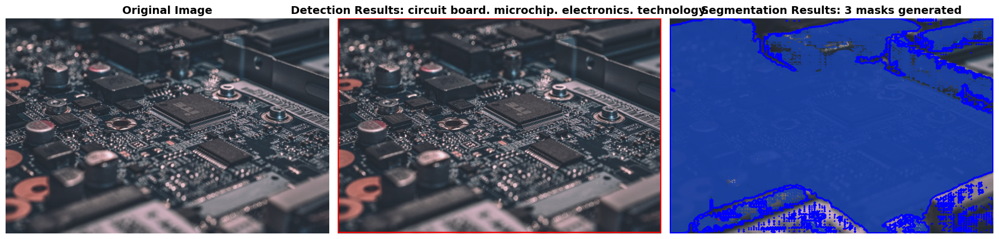


SEGMENTATION STATISTICS
Objects detected: 3
Masks generated: 3
Average confidence: 0.409
  Mask 1: technology (conf: 0.439, coverage: 81.2%)
  Mask 2: electronics (conf: 0.364, coverage: 81.3%)
  Mask 3: circuit board (conf: 0.423, coverage: 81.3%)


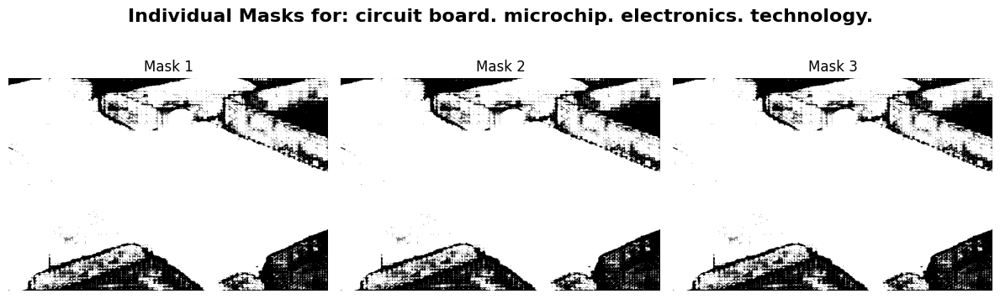

   Success: 3 masks detected
   Avg confidence: 0.409
   Objects: technology, electronics, circuit board

 Configuration: Sensitive
   Box threshold: 0.25, Text threshold: 0.2

Running segmentation demo
Image: sample_images/test/tech_circuit.jpg
Prompt: circuit board. microchip. electronics. technology.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: circuit board. microchip. electronics. technology.
✓ Detected 3 objects
✓ Generated 3 segmentation masks


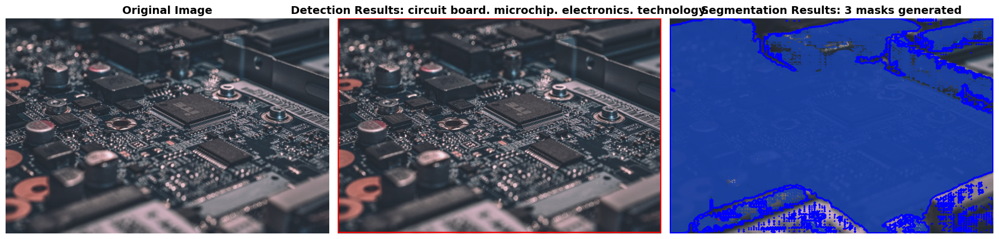


SEGMENTATION STATISTICS
Objects detected: 3
Masks generated: 3
Average confidence: 0.409
  Mask 1: technology (conf: 0.439, coverage: 81.2%)
  Mask 2: electronics (conf: 0.364, coverage: 81.3%)
  Mask 3: circuit board (conf: 0.423, coverage: 81.3%)


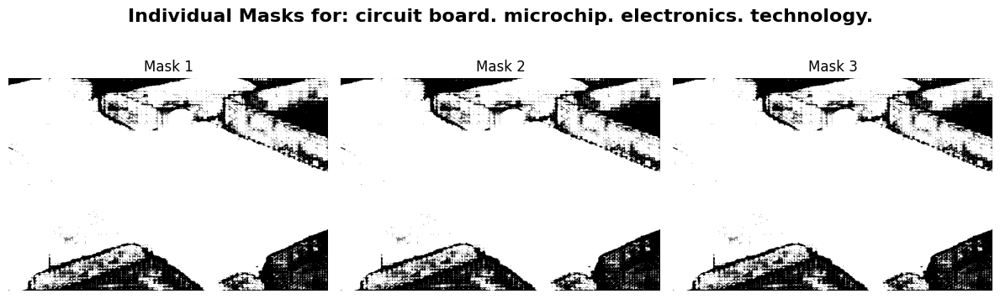

   Success: 3 masks detected
   Avg confidence: 0.409
   Objects: technology, electronics, circuit board

 Configuration: Balanced
   Box threshold: 0.3, Text threshold: 0.25

Running segmentation demo
Image: sample_images/test/tech_circuit.jpg
Prompt: circuit board. microchip. electronics. technology.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: circuit board. microchip. electronics. technology.
✓ Detected 3 objects
✓ Generated 3 segmentation masks


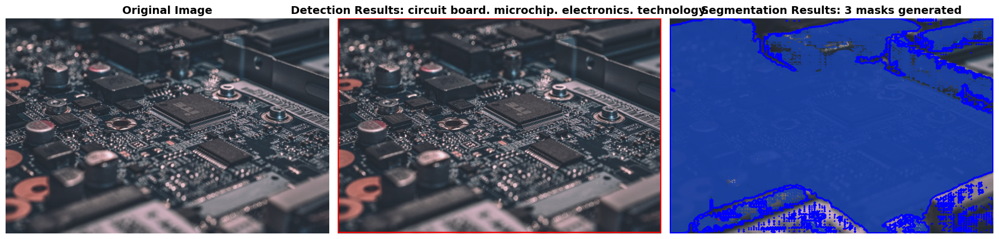


SEGMENTATION STATISTICS
Objects detected: 3
Masks generated: 3
Average confidence: 0.409
  Mask 1: technology (conf: 0.439, coverage: 81.2%)
  Mask 2: electronics (conf: 0.364, coverage: 81.3%)
  Mask 3: circuit board (conf: 0.423, coverage: 81.3%)


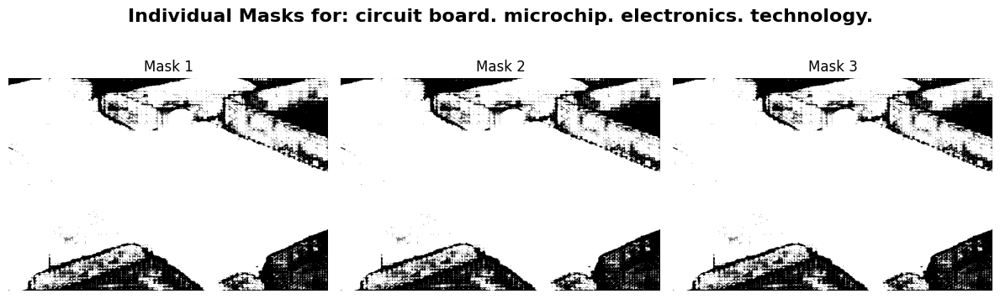

   Success: 3 masks detected
   Avg confidence: 0.409
   Objects: technology, electronics, circuit board

 Configuration: Strict
   Box threshold: 0.35, Text threshold: 0.3

Running segmentation demo
Image: sample_images/test/tech_circuit.jpg
Prompt: circuit board. microchip. electronics. technology.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: circuit board. microchip. electronics. technology.
✓ Detected 3 objects
✓ Generated 3 segmentation masks


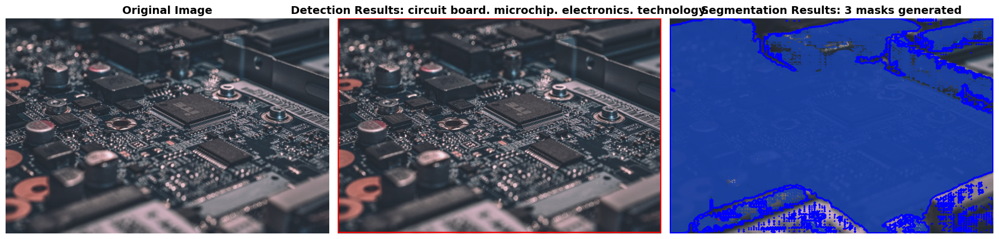


SEGMENTATION STATISTICS
Objects detected: 3
Masks generated: 3
Average confidence: 0.409
  Mask 1: technology (conf: 0.439, coverage: 81.2%)
  Mask 2: electronics (conf: 0.364, coverage: 81.3%)
  Mask 3: circuit board (conf: 0.423, coverage: 81.3%)


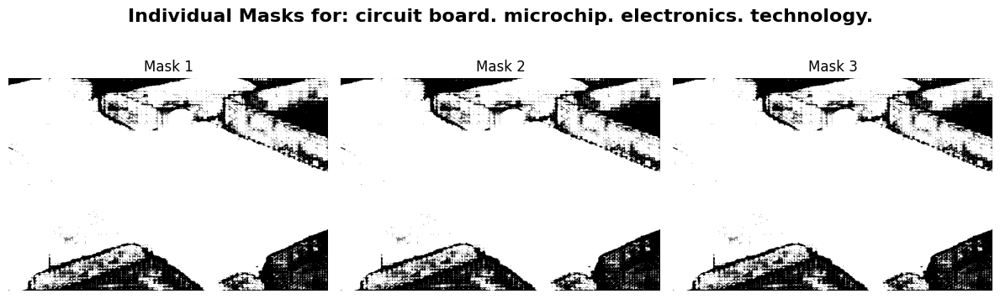

   Success: 3 masks detected
   Avg confidence: 0.409
   Objects: technology, electronics, circuit board

Testing: Vintage car on the street
Image: sample_images/test/classic_car.jpg
Prompt: car. road. wheel. headlight.

 Configuration: Very Sensitive
   Box threshold: 0.2, Text threshold: 0.15

Running segmentation demo
Image: sample_images/test/classic_car.jpg
Prompt: car. road. wheel. headlight.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: car. road. wheel. headlight.
✓ Detected 11 objects
✓ Generated 11 segmentation masks


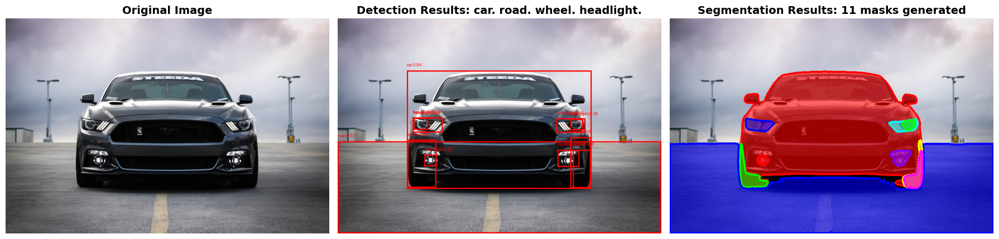


SEGMENTATION STATISTICS
Objects detected: 11
Masks generated: 11
Average confidence: 0.437
  Mask 1: car (conf: 0.943, coverage: 24.4%)
  Mask 2: wheel (conf: 0.684, coverage: 0.6%)
  Mask 3: road (conf: 0.616, coverage: 31.6%)
  Mask 4: wheel (conf: 0.548, coverage: 0.5%)
  Mask 5: wheel (conf: 0.286, coverage: 0.4%)
  Mask 6: headlight (conf: 0.346, coverage: 0.4%)
  Mask 7: headlight (conf: 0.281, coverage: 0.2%)
  Mask 8: headlight (conf: 0.272, coverage: 0.3%)
  Mask 9: headlight (conf: 0.263, coverage: 0.1%)
  Mask 10: headlight (conf: 0.280, coverage: 0.1%)
  Mask 11: headlight (conf: 0.293, coverage: 0.4%)


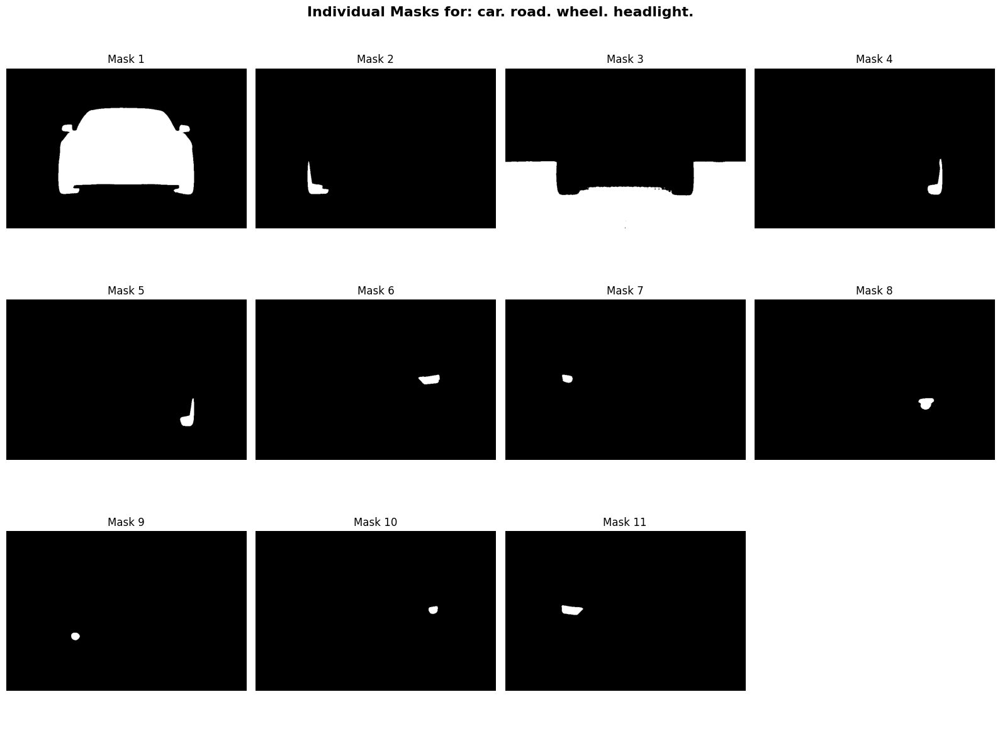

   Success: 11 masks detected
   Avg confidence: 0.437
   Objects: car, wheel, road, wheel, wheel, headlight, headlight, headlight, headlight, headlight, headlight

 Configuration: Sensitive
   Box threshold: 0.25, Text threshold: 0.2

Running segmentation demo
Image: sample_images/test/classic_car.jpg
Prompt: car. road. wheel. headlight.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: car. road. wheel. headlight.
✓ Detected 11 objects
✓ Generated 11 segmentation masks


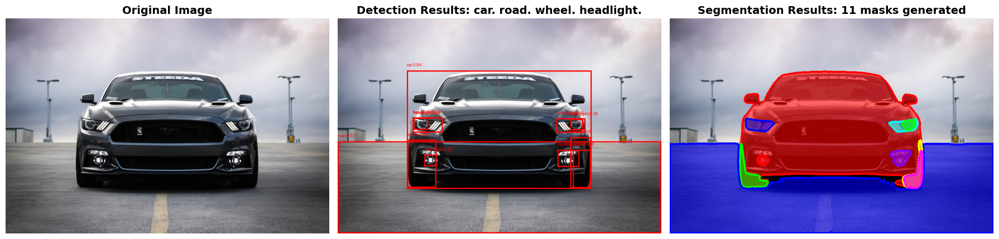


SEGMENTATION STATISTICS
Objects detected: 11
Masks generated: 11
Average confidence: 0.437
  Mask 1: car (conf: 0.943, coverage: 24.4%)
  Mask 2: wheel (conf: 0.684, coverage: 0.6%)
  Mask 3: road (conf: 0.616, coverage: 31.6%)
  Mask 4: wheel (conf: 0.548, coverage: 0.5%)
  Mask 5: wheel (conf: 0.286, coverage: 0.4%)
  Mask 6: headlight (conf: 0.346, coverage: 0.4%)
  Mask 7: headlight (conf: 0.281, coverage: 0.2%)
  Mask 8: headlight (conf: 0.272, coverage: 0.3%)
  Mask 9: headlight (conf: 0.263, coverage: 0.1%)
  Mask 10: headlight (conf: 0.280, coverage: 0.1%)
  Mask 11: headlight (conf: 0.293, coverage: 0.4%)


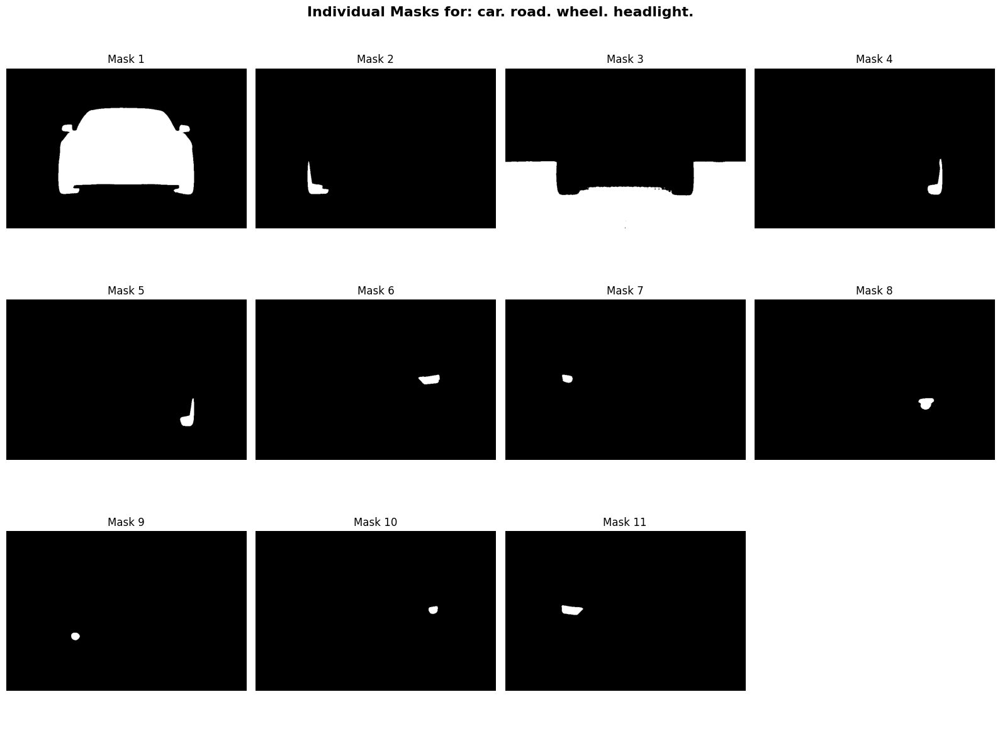

   Success: 11 masks detected
   Avg confidence: 0.437
   Objects: car, wheel, road, wheel, wheel, headlight, headlight, headlight, headlight, headlight, headlight

 Configuration: Balanced
   Box threshold: 0.3, Text threshold: 0.25

Running segmentation demo
Image: sample_images/test/classic_car.jpg
Prompt: car. road. wheel. headlight.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: car. road. wheel. headlight.
✓ Detected 5 objects
✓ Generated 5 segmentation masks


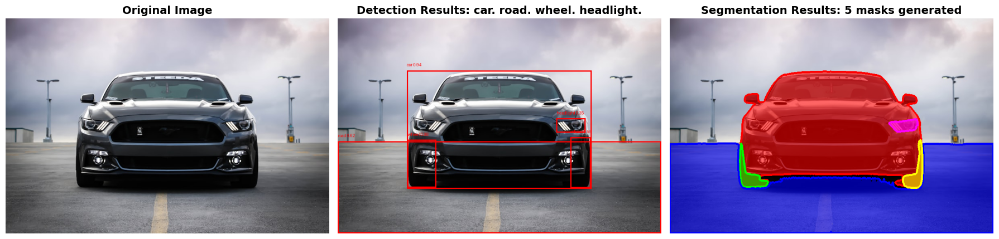


SEGMENTATION STATISTICS
Objects detected: 5
Masks generated: 5
Average confidence: 0.627
  Mask 1: car (conf: 0.943, coverage: 24.4%)
  Mask 2: wheel (conf: 0.684, coverage: 0.6%)
  Mask 3: road (conf: 0.616, coverage: 31.6%)
  Mask 4: wheel (conf: 0.548, coverage: 0.5%)
  Mask 5: headlight (conf: 0.346, coverage: 0.4%)


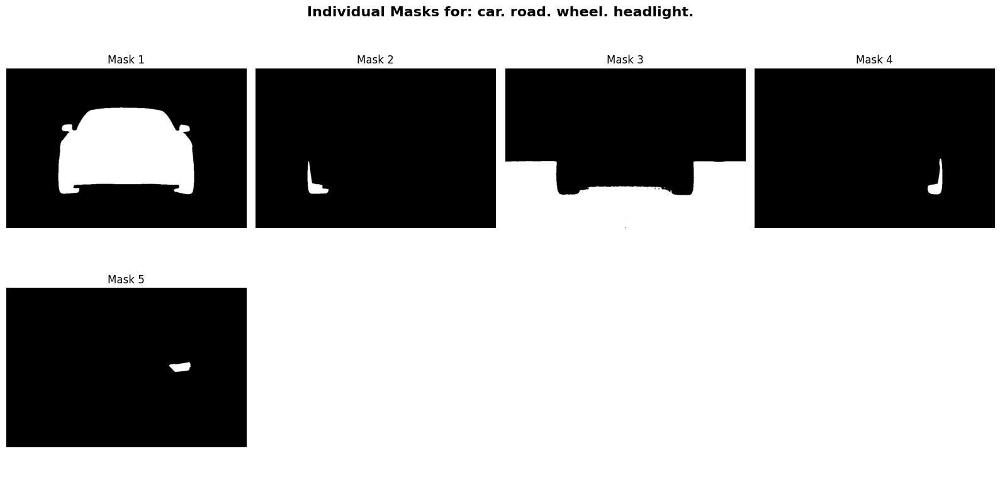

   Success: 5 masks detected
   Avg confidence: 0.627
   Objects: car, wheel, road, wheel, headlight

 Configuration: Strict
   Box threshold: 0.35, Text threshold: 0.3

Running segmentation demo
Image: sample_images/test/classic_car.jpg
Prompt: car. road. wheel. headlight.
--------------------------------------------------
✓ Image loaded: (800, 533)
Processing text prompt: car. road. wheel. headlight.
✓ Detected 4 objects
✓ Generated 4 segmentation masks


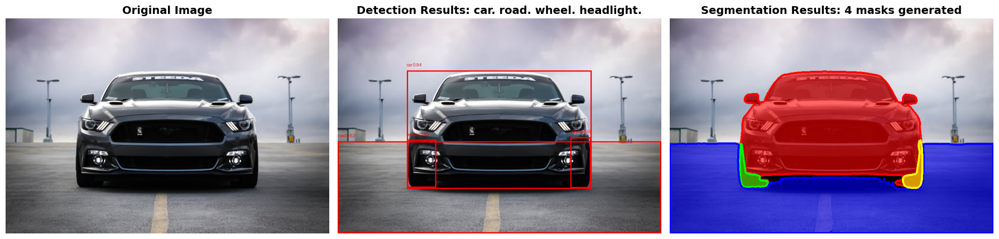


SEGMENTATION STATISTICS
Objects detected: 4
Masks generated: 4
Average confidence: 0.698
  Mask 1: car (conf: 0.943, coverage: 24.4%)
  Mask 2: wheel (conf: 0.684, coverage: 0.6%)
  Mask 3: road (conf: 0.616, coverage: 31.6%)
  Mask 4: wheel (conf: 0.548, coverage: 0.5%)


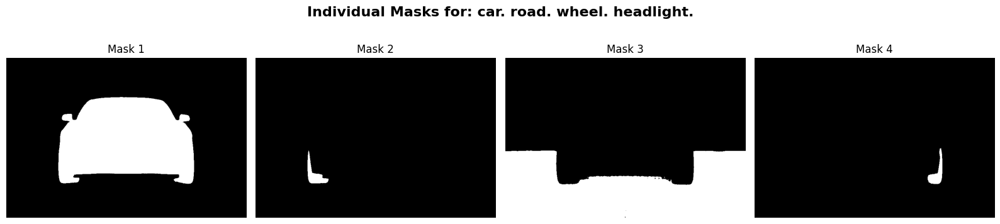

   Success: 4 masks detected
   Avg confidence: 0.698
   Objects: car, wheel, road, wheel

 COMPREHENSIVE TESTING SUMMARY

 Overall Statistics:
  Total tests run: 20
  Successful tests: 20
  Failed tests: 0
  Success rate: 100.0%

 Detection Performance:
  Average masks per successful test: 6.40
  Average detections per test: 6.40
  Average confidence score: 0.461
  Max masks in single test: 14
  Min masks in single test: 1

 Best Performing Configuration:
  Configuration: Very Sensitive
  Average masks: 7.60
  Average confidence: 0.427
  Successful tests: 5

 Per-Image Performance:

  Bustling street market:
    Successful configs: 4/4
    Average masks: 1.00
    Average confidence: 0.468
    Best config: Very Sensitive (1 masks)
    Detected objects: person

  Vintage car on the street:
    Successful configs: 4/4
    Average masks: 7.75
    Average confidence: 0.550
    Best config: Very Sensitive (11 masks)
    Detected objects: car, road, wheel, headlight

  Colorful platter of su

In [39]:
print("\n" + "="*70)
print("COMPREHENSIVE TESTING ON DOWNLOADED IMAGES")
print("="*70)

# Define test cases for 5 downloaded images
test_cases = [
    {
        'path': 'sample_images/test/mountain_scape.jpg',
        'prompt': 'mountain. snow. sky. cloud.',
        'description': 'Majestic mountain landscape'
    },
    {
        'path': 'sample_images/test/street_market.jpg',
        'prompt': 'person. fruit. vegetable. market stall.',
        'description': 'Bustling street market'
    },
    {
        'path': 'sample_images/test/sushi_platter.jpg',
        'prompt': 'sushi. rice. fish. chopsticks. plate.',
        'description': 'Colorful platter of sushi'
    },
    {
        'path': 'sample_images/test/tech_circuit.jpg',
        'prompt': 'circuit board. microchip. electronics. technology.',
        'description': 'Close-up of a tech circuit board'
    },
    {
        'path': 'sample_images/test/classic_car.jpg',
        'prompt': 'car. road. wheel. headlight.',
        'description': 'Vintage car on the street'
    },
]

# Test configurations (varying sensitivity)
configs = [
    {"box_threshold": 0.20, "text_threshold": 0.15, "name": "Very Sensitive"},
    {"box_threshold": 0.25, "text_threshold": 0.20, "name": "Sensitive"},
    {"box_threshold": 0.30, "text_threshold": 0.25, "name": "Balanced"},
    {"box_threshold": 0.35, "text_threshold": 0.30, "name": "Strict"},
]

all_results = []

# Test each image with each configuration
for test_case in test_cases:
    if not os.path.exists(test_case['path']):
        print(f"\n Skipping {test_case['description']} - file not found at {test_case['path']}")
        continue

    print("\n" + "="*70)
    print(f"Testing: {test_case['description']}")
    print(f"Image: {test_case['path']}")
    print(f"Prompt: {test_case['prompt']}")
    print("="*70)

    for config in configs:
        print(f"\n Configuration: {config['name']}")
        print(f"   Box threshold: {config['box_threshold']}, Text threshold: {config['text_threshold']}")

        try:
            masks, results, image = run_segmentation_demo(
                image_path=test_case['path'],
                text_prompt=test_case['prompt'],
                box_threshold=config['box_threshold'],
                text_threshold=config['text_threshold']
            )

            if masks is not None and len(masks) > 0:
                avg_conf = float(np.mean([s.cpu().numpy() for s in results['scores']]))
                result = {
                    'image': test_case['description'],
                    'filename': test_case['path'].split('/')[-1],
                    'prompt': test_case['prompt'],
                    'config': config['name'],
                    'box_threshold': config['box_threshold'],
                    'text_threshold': config['text_threshold'],
                    'num_masks': len(masks),
                    'num_detections': len(results['boxes']),
                    'avg_confidence': avg_conf,
                    'labels': results['labels'],
                    'success': True
                }
                all_results.append(result)
                print(f"   Success: {len(masks)} masks detected")
                print(f"   Avg confidence: {avg_conf:.3f}")
                print(f"   Objects: {', '.join(results['labels'])}")
            else:
                print(f"   No objects detected - try different thresholds")
                all_results.append({
                    'image': test_case['description'],
                    'config': config['name'],
                    'success': False
                })

        except Exception as e:
            print(f"   ✗ Error: {str(e)[:100]}")
            all_results.append({
                'image': test_case['description'],
                'config': config['name'],
                'success': False,
                'error': str(e)[:100]
            })


print("\n" + "="*70)
print(" COMPREHENSIVE TESTING SUMMARY")
print("="*70)

successful_results = [r for r in all_results if r.get('success', False)]
failed_results = [r for r in all_results if not r.get('success', False)]

print(f"\n Overall Statistics:")
print(f"  Total tests run: {len(all_results)}")
print(f"  Successful tests: {len(successful_results)}")
print(f"  Failed tests: {len(failed_results)}")
print(f"  Success rate: {len(successful_results)/len(all_results)*100:.1f}%")

if successful_results:
    print(f"\n Detection Performance:")
    print(f"  Average masks per successful test: {np.mean([r['num_masks'] for r in successful_results]):.2f}")
    print(f"  Average detections per test: {np.mean([r['num_detections'] for r in successful_results]):.2f}")
    print(f"  Average confidence score: {np.mean([r['avg_confidence'] for r in successful_results]):.3f}")
    print(f"  Max masks in single test: {max([r['num_masks'] for r in successful_results])}")
    print(f"  Min masks in single test: {min([r['num_masks'] for r in successful_results])}")

    # Best performing configuration
    print(f"\n Best Performing Configuration:")
    config_scores = {}
    for config_name in set([r['config'] for r in successful_results]):
        config_results = [r for r in successful_results if r['config'] == config_name]
        avg_masks = np.mean([r['num_masks'] for r in config_results])
        avg_conf = np.mean([r['avg_confidence'] for r in config_results])
        config_scores[config_name] = {
            'avg_masks': avg_masks,
            'avg_conf': avg_conf,
            'success_count': len(config_results),
            'score': avg_masks * avg_conf  # Combined score
        }

    best_config = max(config_scores.items(), key=lambda x: x[1]['score'])
    print(f"  Configuration: {best_config[0]}")
    print(f"  Average masks: {best_config[1]['avg_masks']:.2f}")
    print(f"  Average confidence: {best_config[1]['avg_conf']:.3f}")
    print(f"  Successful tests: {best_config[1]['success_count']}")

    # Per-image analysis
    print(f"\n Per-Image Performance:")
    for img_name in set([r['image'] for r in successful_results]):
        img_results = [r for r in successful_results if r['image'] == img_name]
        avg_masks = np.mean([r['num_masks'] for r in img_results])
        avg_conf = np.mean([r['avg_confidence'] for r in img_results])
        best_result = max(img_results, key=lambda x: x['num_masks'])

        print(f"\n  {img_name}:")
        print(f"    Successful configs: {len(img_results)}/{len(configs)}")
        print(f"    Average masks: {avg_masks:.2f}")
        print(f"    Average confidence: {avg_conf:.3f}")
        print(f"    Best config: {best_result['config']} ({best_result['num_masks']} masks)")
        print(f"    Detected objects: {', '.join(set([label for r in img_results for label in r['labels']]))}")

    # Configuration comparison table
    print(f"\n Configuration Comparison Table:")
    print(f"{'Configuration':<20} {'Success Rate':<15} {'Avg Masks':<12} {'Avg Confidence':<15}")
    print("-" * 70)

    for config_name in sorted(config_scores.keys()):
        stats = config_scores[config_name]
        success_rate = (stats['success_count'] / len(test_cases)) * 100
        print(f"{config_name:<20} {success_rate:>6.1f}%{'':<8} {stats['avg_masks']:>6.2f}{'':<6} {stats['avg_conf']:>6.3f}")

else:
    print("\n  No successful detections. Possible issues:")
    print("  - Images may not contain the specified objects")
    print("  - Thresholds might be too strict")
    print("  - Text prompts may not match image content")
    print("\nTry:")
    print("  1. Using more generic prompts (e.g., 'object.')")
    print("  2. Lowering thresholds (box_threshold=0.15, text_threshold=0.10)")
    print("  3. Testing with simpler images containing common objects")

print("\n" + "="*70)
print(" Testing complete!")
print("="*70)


## Video Extension